# **Import external libraries:**

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#
import numpy as np
#
import PIL.Image
from PIL import Image
#
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.image import save_img
from keras.applications import vgg19
#
# import tensorflow.keras.backend as K
from keras import backend as K
import tensorflow as tf
#
from scipy.optimize import fmin_l_bfgs_b
#
import os
import sys
import shutil
import cv2
#
from google.colab import output

# **Download repository for this project:**
  * StyleTransfer (folder) :

    *   content_images (folder)
    *   style_images (folder)
   *   README (Text)

In [2]:
# shutil.rmtree('/content/StyleTransfer', ignore_errors=True) # Line to delete folder

if not os.path.exists('StyleTransfer'):
  ! git clone "https://github.com/Pasba-28/StyleTransfer"



Cloning into 'StyleTransfer'...
remote: Enumerating objects: 107, done.
remote: Counting objects: 100% (107/107), done.
remote: Compressing objects: 100% (102/102), done.
remote: Total 107 (delta 28), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (107/107), 10.65 MiB | 21.22 MiB/s, done.
Resolving deltas: 100% (28/28), done.



# **Weights - for loss calculating:**

In [3]:
total_variation_weight = 2
style_weight = 3
content_weight = 5

# **Function:**

In [4]:
# Preprocessing image to make it compatible with the VGG19 model
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(resized_width, resized_height))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    
    return img

In [5]:
# Function to convert a tensor into an image
def deprocess_image(x):
    x = x.reshape((resized_width, resized_height, 3))

    # Remove zero-center by mean pixel (Necessary when working with VGG model)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68

    # Format BGR->RGB
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    
    return x

In [6]:
# The gram matrix of an image tensor is the inner product between the vectorized feature map in a layer.
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    
    return gram

In [7]:
# The style_loss_per_layer represents the loss between the style of the style reference image and the generated image.
def style_loss_per_layer(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = resized_width * resized_height
    
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

In [8]:
# The total_style_loss represents the total loss between the style of the style reference image and the generated image.
def total_style_loss(feature_layers):
    loss = K.variable(0.)
    for layer_name in feature_layers:
        layer_features = outputs_dict[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss_per_layer(style_reference_features, combination_features)
        loss = loss + (style_weight / len(feature_layers)) * sl
    
    return loss

In [9]:
# The content loss maintains the features of the content image in the generated image.
def content_loss(layer_features):
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    
    return K.sum(K.square(combination_features - base_image_features))

In [10]:
# The total variation loss mantains the generated image loclaly coherent,
# smoothing the pixel variations among neighbour pixels.
def total_variation_loss(x):
    a = K.square(x[:, :resized_width - 1, :resized_height - 1, :] - x[:, 1:, :resized_height - 1, :])
    b = K.square(x[:, :resized_width - 1, :resized_height - 1, :] - x[:, :resized_width - 1, 1:, :])
    
    return K.sum(K.pow(a + b, 1.25))

In [11]:
def total_loss(index):
    loss = K.variable(0.)

    # contribution of content_loss
    feature_layers_content = outputs_dict['block5_conv2']
    loss = loss + content_weight * content_loss(feature_layers_content)

    # contribution of style_loss
    if (index == 1):
      feature_layers_style = ['block1_conv1', 'block1_conv2']
    elif (index == 2):
      feature_layers_style = ['block2_conv1', 'block2_conv2']
    elif (index == 3):
      feature_layers_style = ['block3_conv1', 'block3_conv4']
    elif (index == 4):
      feature_layers_style = ['block4_conv1', 'block4_conv4']
    elif (index == 5):
      feature_layers_style = ['block5_conv1']
    elif (index == 6):
      feature_layers_style = ['block1_conv1', 'block1_conv2',
                            'block2_conv1', 'block2_conv2',
                            'block3_conv1', 'block3_conv4',
                            'block4_conv1', 'block4_conv4',
                            'block5_conv1']

    loss = loss + total_style_loss(feature_layers_style) * style_weight

    # contribution of variation_loss
    loss = loss + total_variation_weight * total_variation_loss(combination_image)
    
    return loss

In [12]:
# Evaluate the loss and the gradients respect to the generated image.
def eval_loss_and_grads(x):
    x = x.reshape((1, resized_width, resized_height, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
        
    return loss_value, grad_values

In [13]:
# Save images
def save(filename, generated):
    save_img(filename, Image.fromarray(generated))

In [14]:
# Evaluator returns the loss and the gradient in two separate functions, but the calculation of the two variables are dependent in eval_loss_and_grads function
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values

        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None

        return grad_values

# **Content image menu:**

<Figure size 432x288 with 0 Axes>

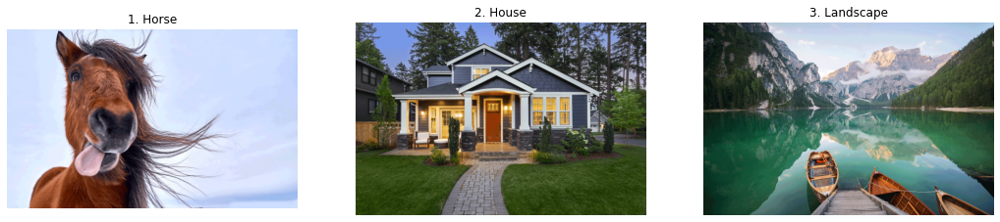

Choose your content image: 
3

 Your choice: Landscape image to process


In [15]:
image_content_path=None

contentTitle = None

plt.subplots_adjust(wspace=2, hspace=2)
plt.figure(figsize=(18, 18))


img1= cv2.imread('/content/StyleTransfer/content_images/content1.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
plt.subplot(1,3,1)
plt.title("1. Horse")
plt.imshow(img1)
plt.axis('off')


img2= cv2.imread('/content/StyleTransfer/content_images/content2.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.subplot(1,3,2)
plt.title("2. House")
plt.imshow(img2)
plt.axis('off')


img3= cv2.imread('/content/StyleTransfer/content_images/content3.png')
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
plt.subplot(1,3,3)
plt.title("3. Landscape")
plt.imshow(img3)
plt.axis('off')

plt.show()


ans=True
while ans:
  ans=input("Choose your content image: \n") 
  if ans=="1": 
    print("\n Your choice: Horse image to process") 
    image_content_path="/content/StyleTransfer/content_images/content1.png"
    contentTitle = 'Horse'
    ans=False
  elif ans=="2":
    print("\n Your choice: House image to process")
    image_content_path="/content/StyleTransfer/content_images/content2.png"
    contentTitle = 'House'
    ans=False 
  elif ans=="3":
    print("\n Your choice: Landscape image to process")
    image_content_path="/content/StyleTransfer/content_images/content3.png"
    contentTitle = 'Landscape'
    ans=False 
  elif ans !="":
    print("\n Not Valid Choice Try again")

## **Styles image menu:**

<Figure size 432x288 with 0 Axes>

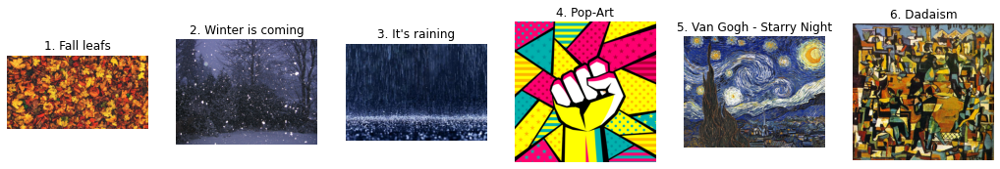

Choose your style image: 
5

 Your choice: Van Gogh - Starry Night style


In [16]:
image_style_path=None

styleTitle = None

plt.subplots_adjust(wspace=2, hspace=2)
plt.figure(figsize=(18, 18))


img1= cv2.imread('/content/StyleTransfer/style_images/style1.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
plt.subplot(1,6,1)
plt.title("1. Fall leafs")
plt.imshow(img1)
plt.axis('off')

img2= cv2.imread('/content/StyleTransfer/style_images/style2.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.subplot(1,6,2)
plt.title("2. Winter is coming")
plt.imshow(img2)
plt.axis('off')

img3= cv2.imread('/content/StyleTransfer/style_images/style3.jpg')
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
plt.subplot(1,6,3)
plt.title("3. It's raining")
plt.imshow(img3)
plt.axis('off')

img4= cv2.imread('/content/StyleTransfer/style_images/style4.jpg')
img4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
plt.subplot(1,6,4)
plt.title("4. Pop-Art")
plt.imshow(img4)
plt.axis('off')

img5= cv2.imread('/content/StyleTransfer/style_images/style5.jpg')
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)
plt.subplot(1,6,5)
plt.title("5. Van Gogh - Starry Night")
plt.imshow(img5)
plt.axis('off')

img6= cv2.imread('/content/StyleTransfer/style_images/style6.jpg')
img6 = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)
plt.subplot(1,6,6)
plt.title("6. Dadaism")
plt.imshow(img6)
plt.axis('off')

plt.show()


ans=True
while ans:
  ans=input("Choose your style image: \n") 
  if ans=="1": 
    print("\n Your choice: Fall leafs style") 
    image_style_path="/content/StyleTransfer/style_images/style1.jpg"
    styleTitle = 'Fall leafs style'
    ans=False
  elif ans=="2":
    print("\n Your choice: Winter is coming")
    image_style_path="/content/StyleTransfer/style_images/style2.jpg"
    styleTitle = 'Winter is coming style'
    ans=False 
  elif ans=="3":
    print("\n Your choice: It's raining style")
    image_style_path="/content/StyleTransfer/style_images/style3.jpg"
    styleTitle = "It's raining style"
    ans=False 
  elif ans=="4":
    print("\n Your choice: Pop-Art style")
    image_style_path="/content/StyleTransfer/style_images/style4.jpg"
    styleTitle = "Pop-Art style"
    ans=False 
  elif ans=="5":
    print("\n Your choice: Van Gogh - Starry Night style")
    image_style_path="/content/StyleTransfer/style_images/style5.jpg"
    styleTitle = "Van Gogh - Starry Night style"
    ans=False 
  elif ans=="6":
    print("\n Your choice: Lines style")
    image_style_path="/content/StyleTransfer/style_images/style6.jpg"
    styleTitle = "Dadaism style"
    ans=False 
  elif ans !="":
    print("\n Not Valid Choice Try again")

## **Your choice:**

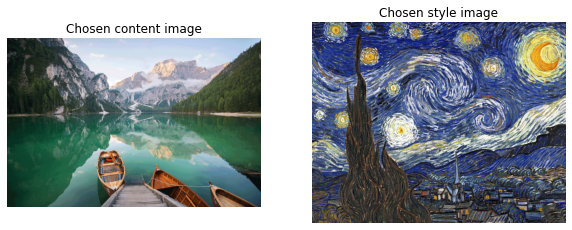

In [17]:
plt.figure(figsize=(10, 10))

contentImg= cv2.imread(image_content_path)
contentImg = cv2.cvtColor(contentImg, cv2.COLOR_BGR2RGB)
plt.subplot(1,2,1)
plt.title("Chosen content image")
plt.imshow(contentImg)
plt.axis('off')

styleImg= cv2.imread(image_style_path)
styleImg = cv2.cvtColor(styleImg, cv2.COLOR_BGR2RGB)
plt.subplot(1,2,2)
plt.title("Chosen style image")
plt.imshow(styleImg)
plt.axis('off')

plt.show()

In [18]:
tf.compat.v1.disable_eager_execution()

# **Feature visualization**

In [19]:
noise_image_path = '/content/StyleTransfer/noise.png'

In [20]:
width, height = load_img(noise_image_path).size
resized_width = 400
resized_height = int(width * resized_width / height)

In [21]:
# Get tensor representations of our images
noise_image = K.variable(preprocess_image(noise_image_path))
style_reference_image = K.variable(preprocess_image(image_style_path))

# Placeholder for generated image
combination_image = K.placeholder((1, resized_width, resized_height, 3))

# Combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([noise_image,
                              style_reference_image,
                              combination_image], axis=0)

# Load VGG-19 model with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)

# Get the outputs of each key layer, through unique names.
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

for i in range(6):
  block_iteration = i + 1
  loss = total_loss(block_iteration)

  # Get the gradients of the generated image
  grads = K.gradients(loss, combination_image)

  outputs = [loss]
  outputs = outputs + grads
  f_outputs = K.function([combination_image], outputs)

  evaluator = Evaluator()
  x = preprocess_image(noise_image_path)

  if(i==5):
    if not os.path.exists('features_visualization_combination'):
      os.makedirs('features_visualization_combination')
    else:
      shutil.rmtree('features_visualization_combination', ignore_errors=True)
      os.makedirs('features_visualization_combination')
  else:
    if not os.path.exists('features_visualization_block_' + np.str(block_iteration)):
      os.makedirs('features_visualization_block_' + np.str(block_iteration))
    else:
      shutil.rmtree('/content/features_visualization_block_' + np.str(block_iteration), ignore_errors=True)
      os.makedirs('features_visualization_block_' + np.str(block_iteration))

  #calculate loss by fmin_l_bfgs_b optimization and sava the deprocess image 
  Iteration = 0
  flag = 0
  min_val =0
  min_val_LastOne=0

  print('Working on block: ' + np.str(block_iteration) )

  while(flag == 0):
      if(min_val != 0):
        min_val_LastOne = min_val
      x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun=25)
      max_iteration = 9

      if(min_val_LastOne != 0):
        if(Iteration >= max_iteration):
          flag = 1        
      
      # Save current generated image
      img = deprocess_image(x.copy())
      if(i==5):
        fname = 'features_visualization_combination/' + np.str(Iteration) + '.png'
      else:
        fname = 'features_visualization_block_'  + np.str(block_iteration) + '/' + np.str(Iteration) + '.png'
      save(fname, img)

      Iteration = Iteration + 1

print("==================================================")
print("Finish!")

80142336/80134624 [==============================] - 1s 0us/step
Working on block: 1
Working on block: 2
Working on block: 3
Working on block: 4
Working on block: 5
Working on block: 6
Finish!


## Plot all features by **block**

Block 1:


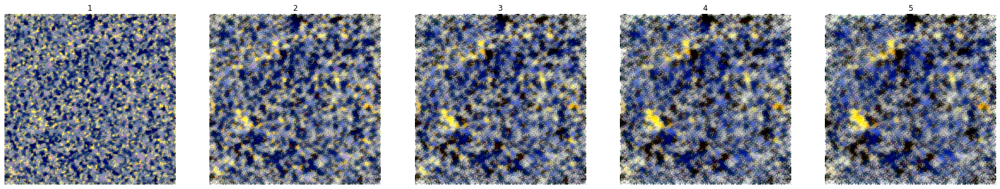

In [22]:
print("Block 1:")
plt.figure(figsize=(28,28))

for i in range(5):
    x= cv2.imread('/content/features_visualization_block_1/' + np.str(i) + '.png')
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    str_title="" + np.str(i + 1)
    plt.title(str_title)
    plt.imshow(x)
    plt.axis('off')

plt.show()

Block 2:


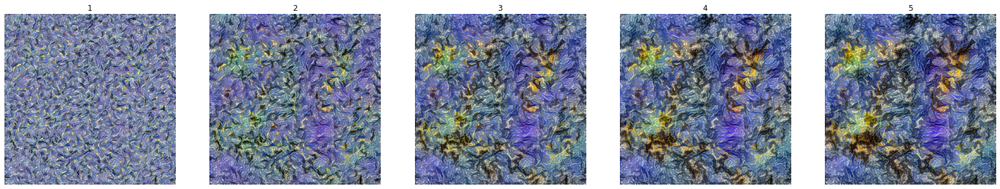

In [23]:
print("Block 2:")
plt.figure(figsize=(28,28))

for i in range(5):
    x= cv2.imread('/content/features_visualization_block_2/' + np.str(i) + '.png')
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    str_title="" + np.str(i + 1)
    plt.title(str_title)
    plt.imshow(x)
    plt.axis('off')

plt.show()

Block 3:


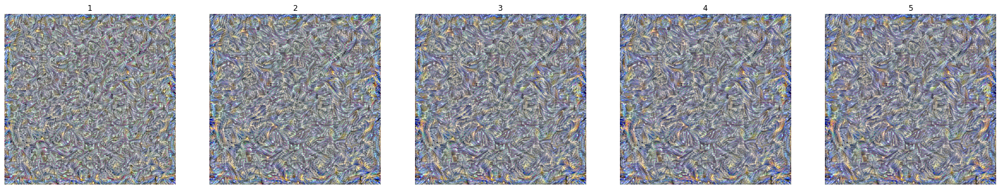

In [24]:
print("Block 3:")
plt.figure(figsize=(28,28))

for i in range(5):
    x= cv2.imread('/content/features_visualization_block_3/' + np.str(i) + '.png')
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    str_title="" + np.str(i + 1)
    plt.title(str_title)
    plt.imshow(x)
    plt.axis('off')

plt.show()

Block 4:


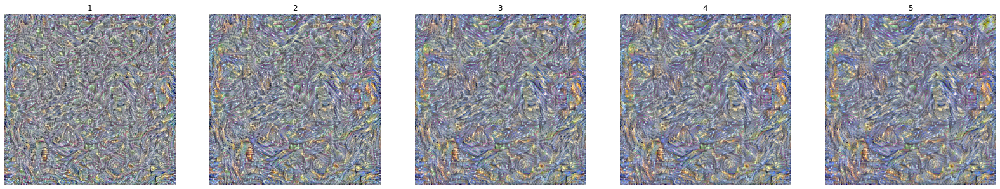

In [25]:
print("Block 4:")
plt.figure(figsize=(28,28))

for i in range(5):
    x= cv2.imread('/content/features_visualization_block_4/' + np.str(i) + '.png')
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    str_title="" + np.str(i + 1)
    plt.title(str_title)
    plt.imshow(x)
    plt.axis('off')

plt.show()

Block 5:


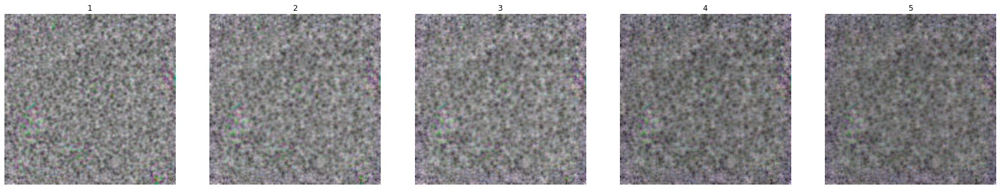

In [26]:
print("Block 5:")
plt.figure(figsize=(28,28))

for i in range(5):
    x= cv2.imread('/content/features_visualization_block_5/' + np.str(i) + '.png')
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    str_title="" + np.str(i + 1)
    plt.title(str_title)
    plt.imshow(x)
    plt.axis('off')

plt.show()

Combination of all the blocks used:


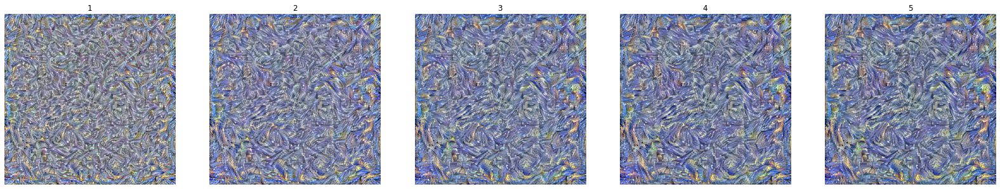

In [27]:
print("Combination of all the blocks used:")
plt.figure(figsize=(28,28))

for i in range(5):
    x= cv2.imread('/content/features_visualization_combination/' + np.str(i) + '.png')
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,i+1)
    str_title="" + np.str(i + 1)
    plt.title(str_title)
    plt.imshow(x)
    plt.axis('off')

plt.show()

# **Create image by style**

In [28]:
# Dimensions of the generated picture.
width, height = load_img(image_content_path).size
resized_width = 400
resized_height = int(width * resized_width / height)

In [29]:
# Get tensor representations of our images
base_image = K.variable(preprocess_image(image_content_path))
style_reference_image = K.variable(preprocess_image(image_style_path))

# Placeholder for generated image
combination_image = K.placeholder((1, resized_width, resized_height, 3))


# Combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

# Load VGG-19 model with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)

model.summary()

# Get the outputs of each key layer, through unique names.
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
loss = total_loss(6)

# Get the gradients of the generated image
grads = K.gradients(loss, combination_image)

outputs = [loss]
outputs = outputs + grads
f_outputs = K.function([combination_image], outputs)

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(3, 400, 599, 3)]        0         
_________________________________________________________________
block1_conv1 (Conv2D)        (3, 400, 599, 64)         1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (3, 400, 599, 64)         36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (3, 200, 299, 64)         0         
_________________________________________________________________
block2_conv1 (Conv2D)        (3, 200, 299, 128)        73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (3, 200, 299, 128)        147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (3, 100, 149, 128)        0     

In [30]:
evaluator = Evaluator()

x = preprocess_image(image_content_path)

## **Image processing by style:**

In [31]:
if not os.path.exists('output_img'):
  os.makedirs('output_img')
else:
  shutil.rmtree('/content/output_img', ignore_errors=True)
  os.makedirs('output_img')

frame_array = []

contentImg= cv2.imread(image_content_path)
contentImg=cv2.resize(contentImg,(resized_height,resized_width))

contentImgCopyForPrint = contentImg

for j in range(28):
  frame_array.append(contentImgCopyForPrint)

cv2.rectangle(contentImgCopyForPrint,(5,5),(len(styleTitle)*18,45), (28, 28, 28), -1) 
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(contentImgCopyForPrint, styleTitle, (10,35), font, 1, (255, 255, 255), 2, cv2.LINE_AA) 

for j in range(28):
  frame_array.append(contentImgCopyForPrint)

In [32]:
#calculate loss by fmin_l_bfgs_b optimization and save the deprocess image 

Iteration = 0
flag = 0
min_val =0
min_val_LastOne=0

while(flag == 0):
    if(min_val != 0):
      min_val_LastOne = min_val
    print('Iteration: ', Iteration)
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun=25)

    print('Current loss value:', min_val)

    max_iteration = 28

    if(min_val_LastOne != 0):
      print(min_val_LastOne / min_val)

      if(min_val_LastOne / min_val < 1.005 or Iteration >= max_iteration):
        flag = 1
        print("==================================================")
        print("Finish!")     
    
    # Save current generated image
    img = deprocess_image(x.copy())
    fname = 'output_img/' + np.str(Iteration) + '.png'
    save(fname, img)

    img = cv2.imread(fname)
    height, width, layers = img.shape
    size = (width,height)

    #inserting the frames into an image array
    if(Iteration==0):
      #For smooth transition
      scale = 0.02
      for k in range(48):  
        mixed = cv2.addWeighted(img, scale, contentImg, 1-scale, 0.0) 
        frame_array.append(mixed)
        scale = scale + 0.02 

      for j in range(10):  
        frame_array.append(img) #Adding new img to frame_array

      prev_image = img

    else:
      #For smooth transition
      scale = 0.05
      for k in range(18):  
        mixed = cv2.addWeighted(img, scale, prev_image, 1-scale, 0.0) 
        frame_array.append(mixed)
        scale = scale + 0.05

      prev_image = img

      frame_array.append(img) #Adding new img to frame_array

    Iteration = Iteration + 1

Iteration:  0
Current loss value: 58740818000.0
Iteration:  1
Current loss value: 33285820000.0
1.76474
Iteration:  2
Current loss value: 26431017000.0
1.259347
Iteration:  3
Current loss value: 23058348000.0
1.1462667
Iteration:  4
Current loss value: 20935680000.0
1.10139
Iteration:  5
Current loss value: 19682814000.0
1.0636528
Iteration:  6
Current loss value: 18868423000.0
1.0431616
Iteration:  7
Current loss value: 18290426000.0
1.0316011
Iteration:  8
Current loss value: 17814462000.0
1.0267178
Iteration:  9
Current loss value: 17419256000.0
1.0226879
Iteration:  10
Current loss value: 17075857000.0
1.0201101
Iteration:  11
Current loss value: 16802484000.0
1.0162698
Iteration:  12
Current loss value: 16603707000.0
1.0119718
Iteration:  13
Current loss value: 16425291000.0
1.0108624
Iteration:  14
Current loss value: 16200933000.0
1.0138484
Iteration:  15
Current loss value: 16036451000.0
1.0102568
Iteration:  16
Current loss value: 15917123000.0
1.0074968
Iteration:  17
Current

## **Last image created:**

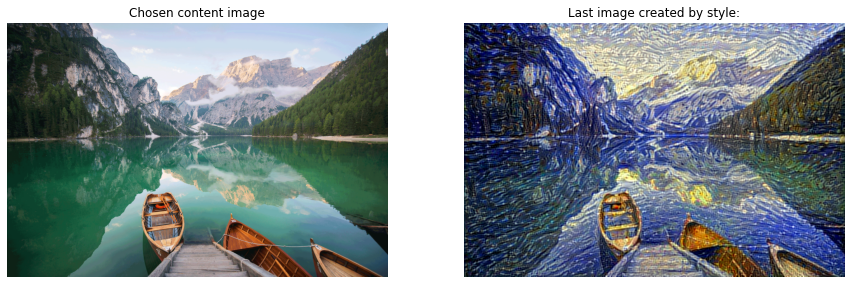

In [38]:
plt.figure(figsize=(15, 15))

contentImg= cv2.imread(image_content_path)
contentImg = cv2.cvtColor(contentImg, cv2.COLOR_BGR2RGB)
plt.subplot(1,2,1)
plt.title("Chosen content image")
plt.imshow(contentImg)
plt.axis('off')

styleImg= cv2.imread('/content/output_img/' + np.str(Iteration - 1) + '.png')
styleImg = cv2.cvtColor(styleImg, cv2.COLOR_BGR2RGB)
plt.subplot(1,2,2)
plt.title("Last image created by style:")
plt.imshow(styleImg)
plt.axis('off')

plt.show()


## **Video creation:**


In [34]:
pathOut = 'videoOutput.mp4'

fps = 25

print("FPS:",fps)
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'DIVX'), fps, size)
for i in range(len(frame_array)):
    # writing to a image array
    out.write(frame_array[i])
out.release()

FPS: 25


## **Next cell works only at 'Safari' browser**

In [35]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('videoOutput.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [36]:
#Make sound when video is ready
output.eval_js('new Audio("http://soundbible.com/mp3/Metal_Gong-Dianakc-109711828.mp3").play()')